In [1]:
!pip install --upgrade scikit-learn

In [2]:
from sklearn.metrics import confusion_matrix,precision_score,f1_score,cohen_kappa_score,accuracy_score

In [3]:
#1 Importing the libraries
import pandas as pd
import numpy as np
import seaborn as sns
import scipy.stats as s
import matplotlib.pyplot as plt
#sns.set(style = 'whitegrid')
import warnings
warnings.filterwarnings('ignore')

from sklearn.metrics import classification_report

from sklearn.feature_selection import RFE
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
from sklearn.linear_model import LogisticRegression

from sklearn.preprocessing import StandardScaler

import statsmodels.api as sm

from sklearn.tree import DecisionTreeClassifier,export_graphviz
from sklearn.metrics import plot_roc_curve,roc_auc_score,roc_curve

from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,StackingClassifier

from xgboost import XGBClassifier

import pydotplus

from IPython.display import Image

import os
#os.environ["PATH"] += os.pathsep + 'C:\Users\Lenovo\anaconda3\Library\bin'

from sklearn.model_selection import GridSearchCV,RandomizedSearchCV, cross_val_score

import lime
from lime import lime_tabular

#import shap

from statsmodels.stats.outliers_influence import variance_inflation_factor

ImportError: cannot import name 'plot_confusion_matrix' from 'sklearn.metrics' (C:\Users\deeps\.conda\envs\example\Lib\site-packages\sklearn\metrics\__init__.py)

In [4]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

In [5]:
#2. Check the data for any inconsistencies and address those
#2.1. Some rows have empty custid, #N/A as values for created,firstorder,lastorder
#2.2. Some rows have the date as 1/0/00 for firstorder column

#3. Cleaning the Data
data = pd.read_csv('C:/GitHub/ai-machine-learning/data/storedata_total.csv')
data.head() 

,custid,retained,created,firstorder,lastorder,esent,eopenrate,eclickrate,avgorder,ordfreq,paperless,refill,doorstep,favday,city
0,6H6T6N,0,9/28/2012,8/11/2013,8/11/2013,29,100.000000,3.448276,14.52,0.000000,0,0,0,Monday,DEL
1,APCENR,1,12/19/2010,4/1/2011,1/19/2014,95,92.631579,10.526316,83.69,0.181641,1,1,1,Friday,DEL
2,7UP6MS,0,10/3/2010,12/1/2010,7/6/2011,0,0.000000,0.000000,33.58,0.059908,0,0,0,Wednesday,DEL
3,7ZEW8G,0,10/22/2010,3/28/2011,3/28/2011,0,0.000000,0.000000,54.96,0.000000,0,0,0,Thursday,BOM
4,8V726M,1,11/27/2010,11/29/2010,1/28/2013,30,90.000000,13.333333,111.91,0.008850,0,0,0,Monday,BOM


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30801 entries, 0 to 30800
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   custid      30781 non-null  object 
 1   retained    30801 non-null  int64  
 2   created     30781 non-null  object 
 3   firstorder  30781 non-null  object 
 4   lastorder   30781 non-null  object 
 5   esent       30801 non-null  int64  
 6   eopenrate   30801 non-null  float64
 7   eclickrate  30801 non-null  float64
 8   avgorder    30801 non-null  float64
 9   ordfreq     30801 non-null  float64
 10  paperless   30801 non-null  int64  
 11  refill      30801 non-null  int64  
 12  doorstep    30801 non-null  int64  
 13  favday      30801 non-null  object 
 14  city        30801 non-null  object 
dtypes: float64(4), int64(5), object(6)
memory usage: 3.5+ MB


In [7]:
data.describe()

,retained,esent,eopenrate,eclickrate,avgorder,ordfreq,paperless,refill,doorstep
count,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000
mean,0.794520,28.138405,25.554838,5.671139,61.873944,0.037729,0.649037,0.095094,0.038895
std,0.404059,16.751380,29.557106,10.561704,41.007588,0.103932,0.477279,0.293350,0.193347
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,16.000000,2.040816,0.000000,40.020000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,32.000000,13.207547,0.000000,50.970000,0.000000,1.000000,0.000000,0.000000
75%,1.000000,42.000000,40.000000,7.142857,74.280000,0.040816,1.000000,0.000000,0.000000
max,1.000000,291.000000,100.000000,100.000000,2600.140000,3.250000,1.000000,1.000000,1.000000


In [8]:
data.isnull().sum()

custid        20
retained       0
created       20
firstorder    20
lastorder     20
esent          0
eopenrate      0
eclickrate     0
avgorder       0
ordfreq        0
paperless      0
refill         0
doorstep       0
favday         0
city           0
dtype: int64

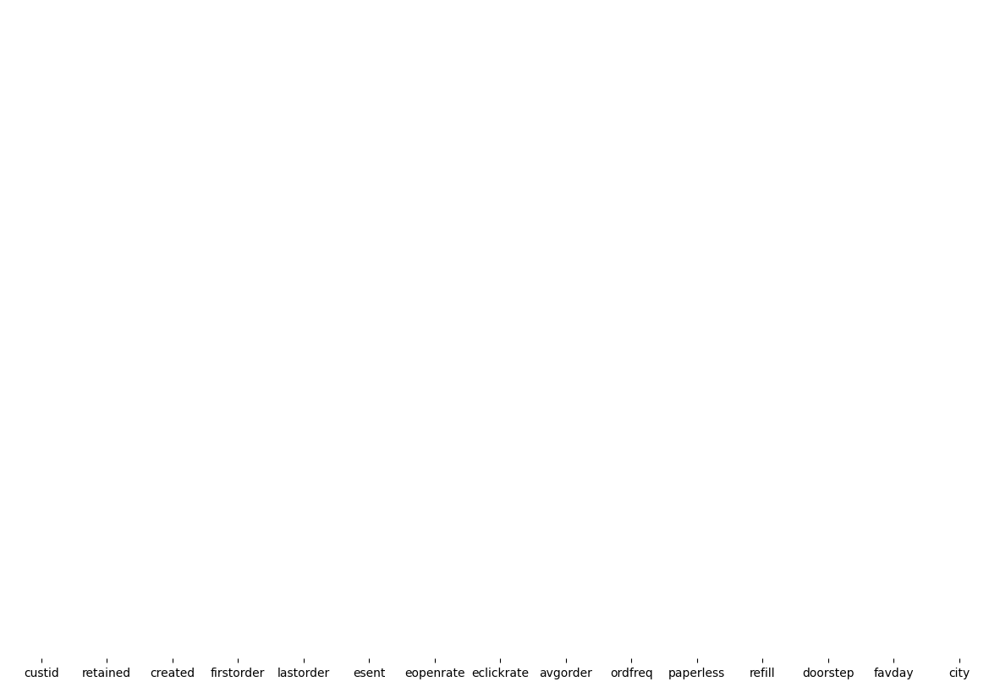

In [9]:
#2. Check the data for any inconsistencies and address those
#2.1. Some rows have empty custid, #N/A as values for created,firstorder,lastorder
#2.2. Some rows have the date as 1/0/00 for firstorder column
plt.figure(figsize=(15, 10))
sns.heatmap(data.isnull(), cmap='binary', cbar=False, yticklabels=False);

In [10]:
#Fill NA/NaN values by using the next valid observation to fill the gap.
data.fillna(method='bfill', inplace=True)

In [11]:
#returns the number of missing values in the dataset
data.isnull().sum()

custid        0
retained      0
created       0
firstorder    0
lastorder     0
esent         0
eopenrate     0
eclickrate    0
avgorder      0
ordfreq       0
paperless     0
refill        0
doorstep      0
favday        0
city          0
dtype: int64

In [12]:
# we are checking for cells where firstorder column value equals 1/0/00 and replacing those cells with values from created column
first_ord = []
for i in range(0, len(data)):
    if i in data[(data.firstorder == '1/0/00')].index:
        first_ord.append(data.created[i])
    else:
        first_ord.append(data.firstorder[i])
data['firstorder'] = first_ord

last_ord = []
for i in range(0, len(data)):
    if i in data[(data.lastorder == '1/0/00')].index:
        last_ord.append(data.firstorder[i])
    else:
        last_ord.append(data.lastorder[i])
data['lastorder'] = last_ord

In [13]:
data.head()

,custid,retained,created,firstorder,lastorder,esent,eopenrate,eclickrate,avgorder,ordfreq,paperless,refill,doorstep,favday,city
0,6H6T6N,0,9/28/2012,8/11/2013,8/11/2013,29,100.000000,3.448276,14.52,0.000000,0,0,0,Monday,DEL
1,APCENR,1,12/19/2010,4/1/2011,1/19/2014,95,92.631579,10.526316,83.69,0.181641,1,1,1,Friday,DEL
2,7UP6MS,0,10/3/2010,12/1/2010,7/6/2011,0,0.000000,0.000000,33.58,0.059908,0,0,0,Wednesday,DEL
3,7ZEW8G,0,10/22/2010,3/28/2011,3/28/2011,0,0.000000,0.000000,54.96,0.000000,0,0,0,Thursday,BOM
4,8V726M,1,11/27/2010,11/29/2010,1/28/2013,30,90.000000,13.333333,111.91,0.008850,0,0,0,Monday,BOM


In [14]:
data.isnull().sum()

custid        0
retained      0
created       0
firstorder    0
lastorder     0
esent         0
eopenrate     0
eclickrate    0
avgorder      0
ordfreq       0
paperless     0
refill        0
doorstep      0
favday        0
city          0
dtype: int64

In [15]:
#Changing the columns into datetime
data['firstorder'] = data.firstorder.astype('datetime64[ns]')
data['lastorder'] = data.lastorder.astype('datetime64[ns]')
data['created'] = data.created.astype('datetime64[ns]')

In [16]:
data.head()

,custid,retained,created,firstorder,lastorder,esent,eopenrate,eclickrate,avgorder,ordfreq,paperless,refill,doorstep,favday,city
0,6H6T6N,0,2012-09-28,2013-08-11,2013-08-11,29,100.000000,3.448276,14.52,0.000000,0,0,0,Monday,DEL
1,APCENR,1,2010-12-19,2011-04-01,2014-01-19,95,92.631579,10.526316,83.69,0.181641,1,1,1,Friday,DEL
2,7UP6MS,0,2010-10-03,2010-12-01,2011-07-06,0,0.000000,0.000000,33.58,0.059908,0,0,0,Wednesday,DEL
3,7ZEW8G,0,2010-10-22,2011-03-28,2011-03-28,0,0.000000,0.000000,54.96,0.000000,0,0,0,Thursday,BOM
4,8V726M,1,2010-11-27,2010-11-29,2013-01-28,30,90.000000,13.333333,111.91,0.008850,0,0,0,Monday,BOM


In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30801 entries, 0 to 30800
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   custid      30801 non-null  object        
 1   retained    30801 non-null  int64         
 2   created     30801 non-null  datetime64[ns]
 3   firstorder  30801 non-null  datetime64[ns]
 4   lastorder   30801 non-null  datetime64[ns]
 5   esent       30801 non-null  int64         
 6   eopenrate   30801 non-null  float64       
 7   eclickrate  30801 non-null  float64       
 8   avgorder    30801 non-null  float64       
 9   ordfreq     30801 non-null  float64       
 10  paperless   30801 non-null  int64         
 11  refill      30801 non-null  int64         
 12  doorstep    30801 non-null  int64         
 13  favday      30801 non-null  object        
 14  city        30801 non-null  object        
dtypes: datetime64[ns](3), float64(4), int64(5), object(3)
memory usage: 3.

In [20]:
#writing cleaned data to disk
os.makedirs('C:/GitHub/ai-machine-learning/cleaned-data', exist_ok=True)
df.to_csv('C:/GitHub/ai-machine-learning/cleaned-data/Store_Data_after_EDA2.csv')

NameError: name 'df' is not defined

In [19]:
import os

In [22]:
#writing cleaned data to disk
os.makedirs('C:/GitHub/ai-machine-learning/cleaned-data', exist_ok=True)
data.to_csv('C:/GitHub/ai-machine-learning/cleaned-data/Store_Data_after_EDA2.csv')

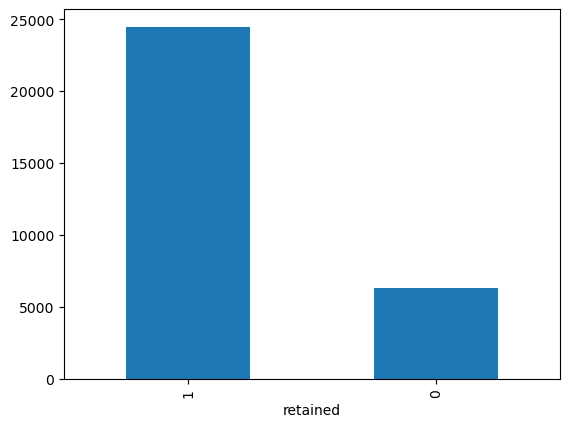

In [23]:
data.retained.value_counts().plot(kind='bar')
plt.show()

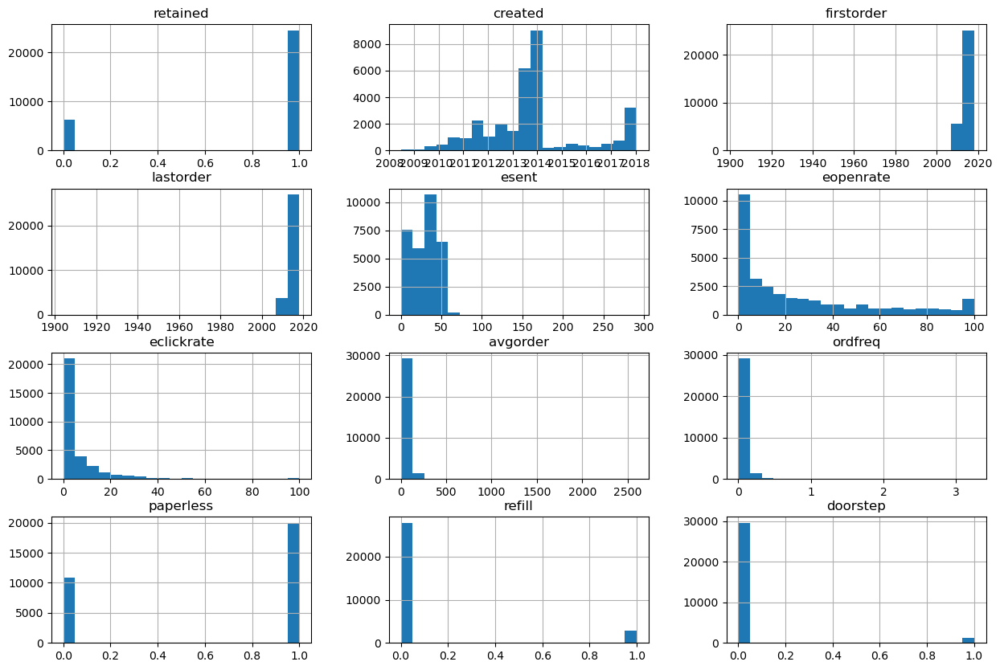

In [24]:
# The data is imbalanced - The majority class is substantially larger than the minority class, and 
# this imbalance can potentially impact the performance of machine learning models. 
# Algorithms trained on imbalanced data might struggle to accurately predict the minority class, 
# as they have fewer examples to learn from. To address this imbalance, you might consider 
# techniques such as oversampling the minority class, undersampling the majority class, 
# or using more advanced methods like generating synthetic samples. 
# These strategies aim to balance the representation of classes in the dataset and 
# improve the model's ability to generalize to the minority class.

data.hist(bins=20,figsize=(15,10))
plt.show()

In [25]:
data['create_first'] = data.firstorder - data.created
data['create_first'] = data['create_first']/np.timedelta64(1,'D')
data['first_last'] = data.lastorder - data.firstorder
data['first_last'] = data['first_last']/np.timedelta64(1,'D')

In [26]:
data.describe()

,retained,created,firstorder,lastorder,esent,eopenrate,eclickrate,avgorder,ordfreq,paperless,refill,doorstep,create_first,first_last
count,30801.000000,30801,30801,30801,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000,30801.000000
mean,0.794520,2013-10-12 17:45:45.144637952,2013-11-16 02:43:54.693678848,2014-02-06 16:09:40.656472064,28.138405,25.554838,5.671139,61.873944,0.037729,0.649037,0.095094,0.038895,34.373722,82.559560
min,0.000000,2008-06-17 00:00:00,1904-01-01 00:00:00,1904-01-01 00:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-41553.000000,-41526.000000
25%,1.000000,2012-09-03 00:00:00,2012-12-18 00:00:00,2013-06-21 00:00:00,16.000000,2.040816,0.000000,40.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,2013-09-22 00:00:00,2013-10-04 00:00:00,2013-10-30 00:00:00,32.000000,13.207547,0.000000,50.970000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,1.000000,2013-12-16 00:00:00,2013-12-27 00:00:00,2014-01-13 00:00:00,42.000000,40.000000,7.142857,74.280000,0.040816,1.000000,0.000000,0.000000,22.000000,46.000000
max,1.000000,2018-01-17 00:00:00,2018-01-21 00:00:00,2018-01-21 00:00:00,291.000000,100.000000,100.000000,2600.140000,3.250000,1.000000,1.000000,1.000000,1998.000000,1985.000000
std,0.404059,NaN,NaN,NaN,16.751380,29.557106,10.561704,41.007588,0.103932,0.477279,0.293350,0.193347,544.575797,615.701532


In [28]:
#Drop columns 'ordfreq', 'custid', 'firstorder', 'lastorder', 'created'
data = data.drop(['ordfreq', 'custid'], axis=1)
data = data.drop(['firstorder', 'lastorder', 'created'], axis=1)
data.head()

,retained,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,favday,city,create_first,first_last
0,0,29,100.000000,3.448276,14.52,0,0,0,Monday,DEL,317.0,0.0
1,1,95,92.631579,10.526316,83.69,1,1,1,Friday,DEL,103.0,1024.0
2,0,0,0.000000,0.000000,33.58,0,0,0,Wednesday,DEL,59.0,217.0
3,0,0,0.000000,0.000000,54.96,0,0,0,Thursday,BOM,157.0,0.0
4,1,30,90.000000,13.333333,111.91,0,0,0,Monday,BOM,2.0,791.0


Test-Train Split

In [29]:
inp = data.drop('retained', axis=1)
out = data.retained
from sklearn.model_selection import train_test_split
xtrain, xtest, ytrain, ytest = train_test_split(inp, out, test_size=.3, random_state=12)

Outlier Treatment

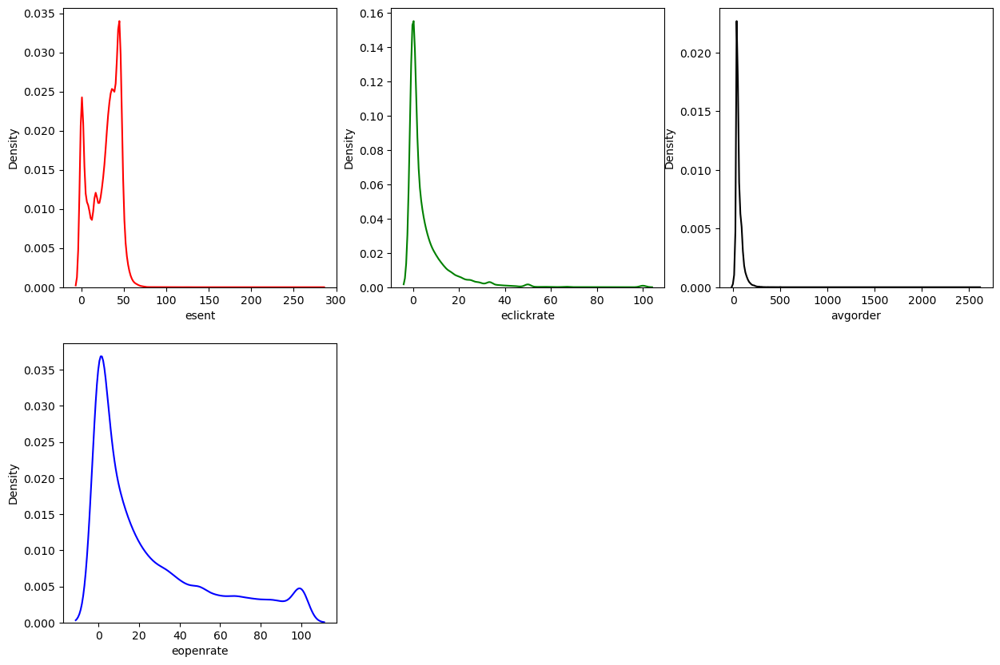

In [30]:
plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
sns.kdeplot(xtrain.esent,color='red');
plt.subplot(2,3,2)
sns.kdeplot(data.eclickrate,color='green')
plt.subplot(2,3,3)
sns.kdeplot(data.avgorder,color='black')
plt.subplot(2,3,4)
sns.kdeplot(data.eopenrate,color='blue')
plt.show()

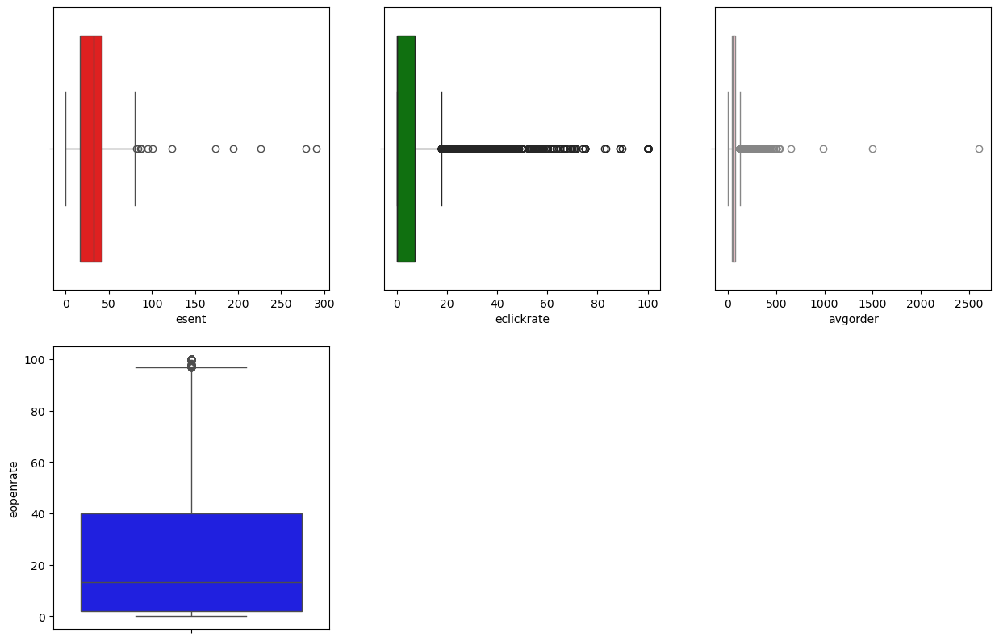

In [31]:
plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
sns.boxplot(x = data.esent,color='red');
plt.subplot(2,3,2)
sns.boxplot(x = data.eclickrate,color='green')
plt.subplot(2,3,3)
sns.boxplot(x = data.avgorder,color='pink')
plt.subplot(2,3,4)
sns.boxplot(data.eopenrate,color='blue')
plt.show()

Imputation

In [32]:
# This Python function, named impute, is designed for imputing (replacing) values in a DataFrame x based on a set of rules. 
# The primary goal appears to be handling outliers and negative values.Calculates the interquartile range (IQR) and Thresholds
def impute(x):
    for i in x.columns:
        iqr = 1.5 * (x[i].quantile(0.75) - x[i].quantile(0.25))
        ul = x[i].quantile(0.75) + iqr
        ll = x[i].quantile(0.25) - iqr
        temp = []
        for j in x[i].index:
            if x[i][j] > ul or x[i][j] < ll:
                temp.append(np.median(x[i]))
            elif x[i][j] < 0:
                temp.append(0)
            else:
                temp.append(x[i][j])
        x[i] = temp
    return x

In [33]:
xtrain[['esent','eclickrate','avgorder','eopenrate']] = impute(xtrain[['esent','eclickrate','avgorder','eopenrate']])
xtest[['esent','eclickrate','avgorder','eopenrate']] = impute(xtest[['esent','eclickrate','avgorder','eopenrate']])

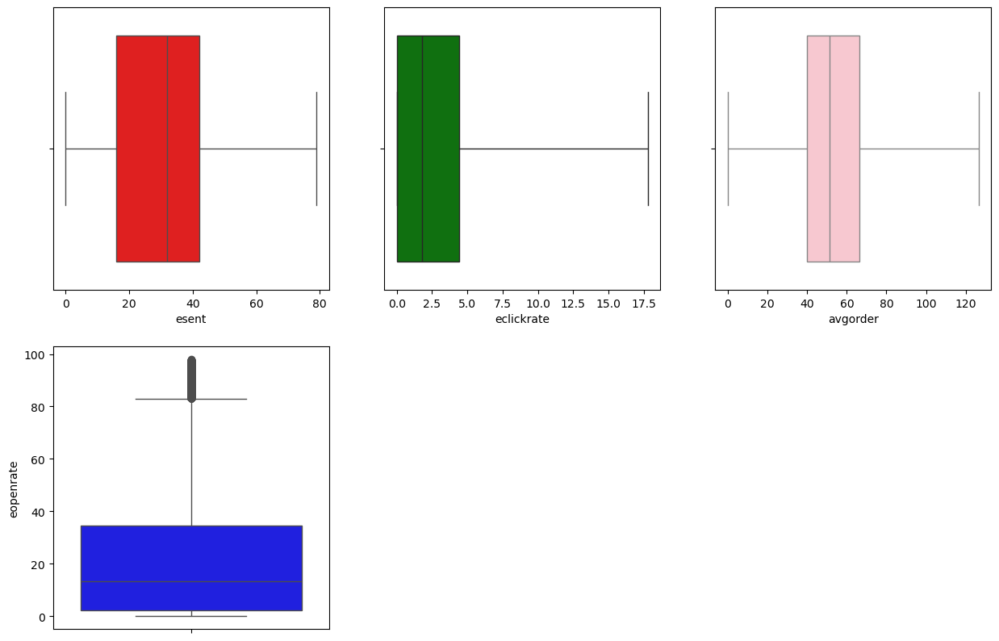

In [34]:
plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
sns.boxplot(x = xtrain.esent,color='red');
plt.subplot(2,3,2)
sns.boxplot(x = xtrain.eclickrate,color='green',whis=6)
plt.subplot(2,3,3)
sns.boxplot(x = xtrain.avgorder,color='pink',whis=3)
plt.subplot(2,3,4)
sns.boxplot(xtrain.eopenrate,color='blue')
plt.show()

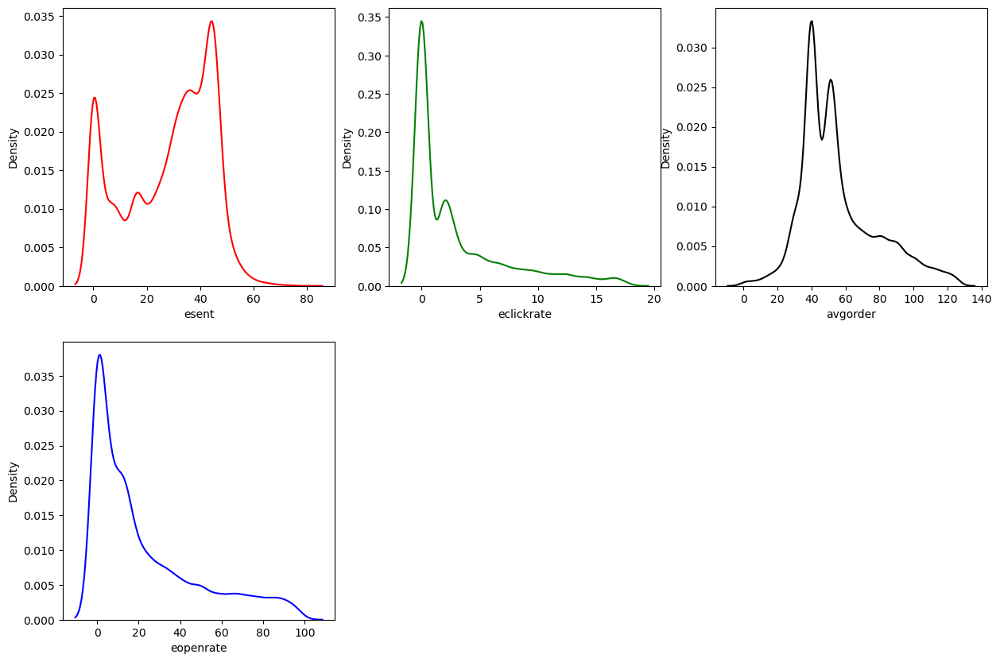

In [35]:
plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
sns.kdeplot(xtrain.esent,color='red');
plt.subplot(2,3,2)
sns.kdeplot(xtrain.eclickrate,color='green')
plt.subplot(2,3,3)
sns.kdeplot(xtrain.avgorder,color='black')
#plt.subplot(2,3,4)
#sns.kdeplot(xtrain.ordfreq,color='orange')
plt.subplot(2,3,4)
sns.kdeplot(xtrain.eopenrate,color='blue')
plt.show()

In [36]:
xtrain.describe()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last
count,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000
mean,28.134647,22.486722,2.954306,55.275783,0.648840,0.094017,0.039100,37.458163,86.872032
std,16.502098,25.799586,4.249084,22.770930,0.477344,0.291859,0.193838,419.433613,536.450096
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-41551.000000,-41448.000000
25%,16.000000,2.127660,0.000000,40.020000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,32.000000,13.333333,1.785714,51.120000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,42.000000,34.498433,4.444444,66.522500,1.000000,0.000000,0.000000,22.000000,49.000000
max,79.000000,98.000000,17.777778,126.570000,1.000000,1.000000,1.000000,1915.000000,1985.000000


Data Visualization

<Axes: xlabel='create_first', ylabel='retained'>

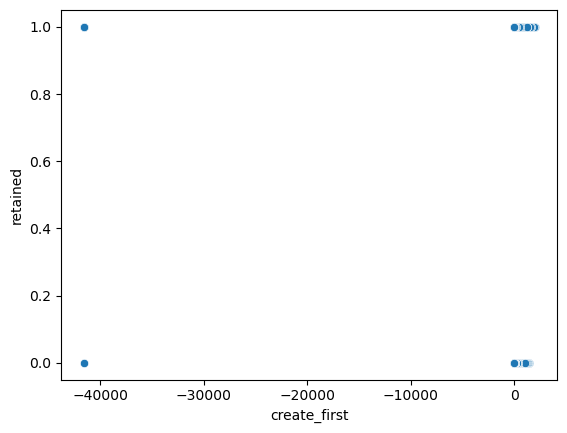

In [37]:
sns.scatterplot(x = data.create_first, y = data.retained)

<Axes: xlabel='first_last', ylabel='retained'>

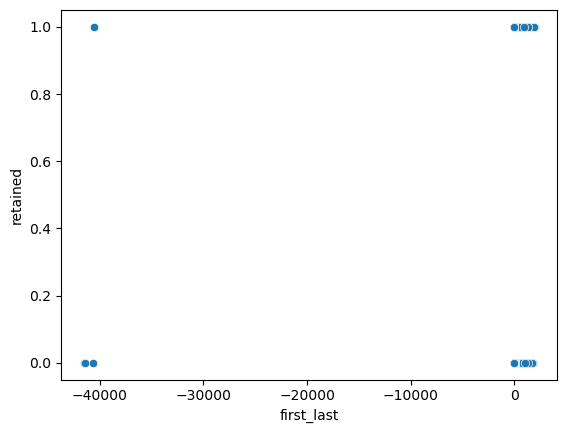

In [38]:
sns.scatterplot(x = data.first_last, y = data.retained)

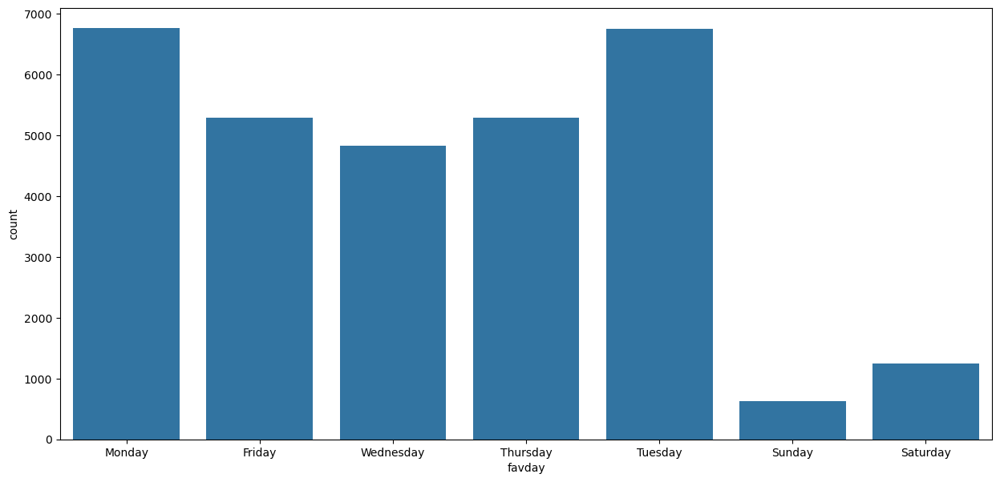

In [39]:
plt.figure(figsize=(15,7))
sns.countplot(x = data.favday)
plt.show()

<Axes: xlabel='city'>

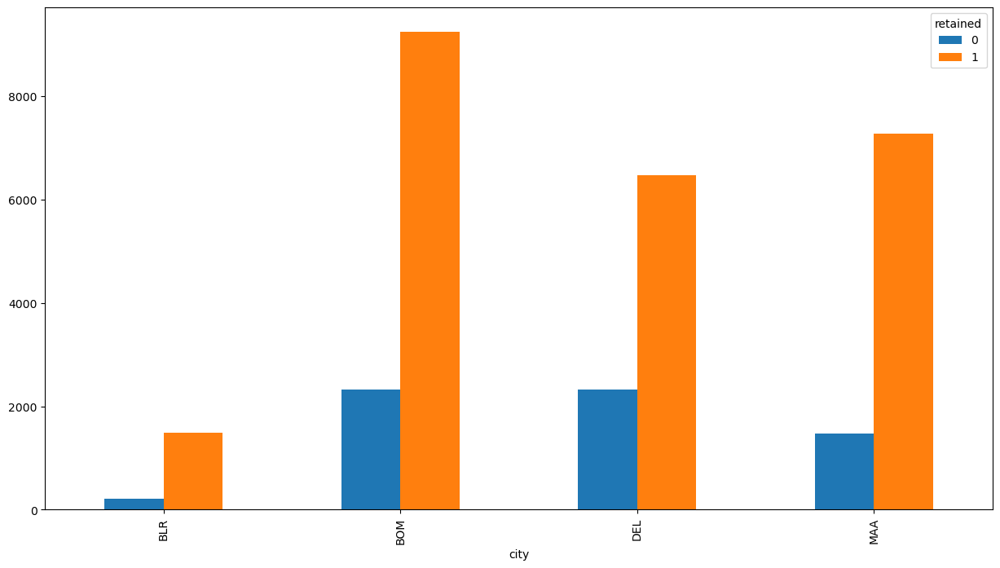

In [40]:
pd.crosstab(index=data.city,columns=data.retained).plot(kind='bar',figsize=(15,8))

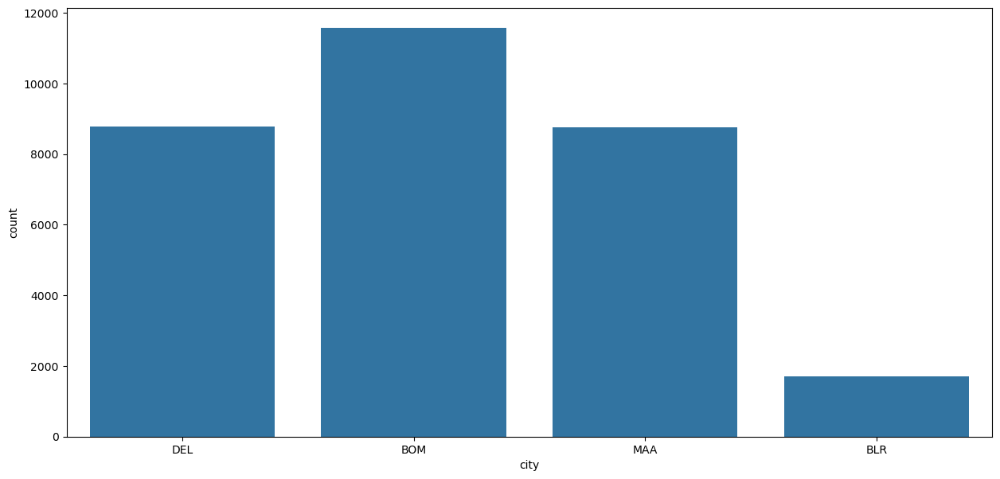

In [41]:
plt.figure(figsize=(15,7))
sns.countplot(x = data.city)
plt.show()

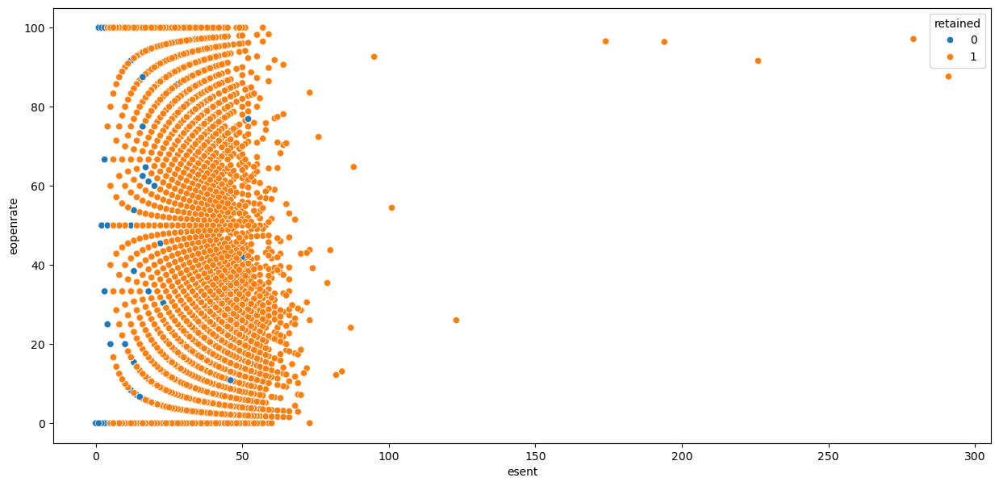

In [42]:
plt.figure(figsize=(15,7))
sns.scatterplot(x= data.esent, y = data.eopenrate, hue= data.retained)
plt.show()

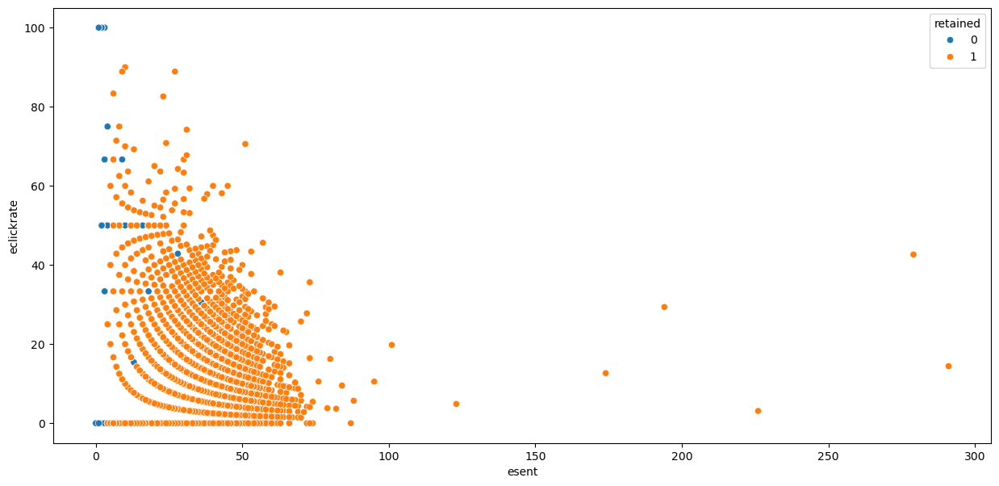

In [43]:
plt.figure(figsize=(15,7))
sns.scatterplot(x= data.esent, y = data.eclickrate, hue= data.retained)
plt.show()

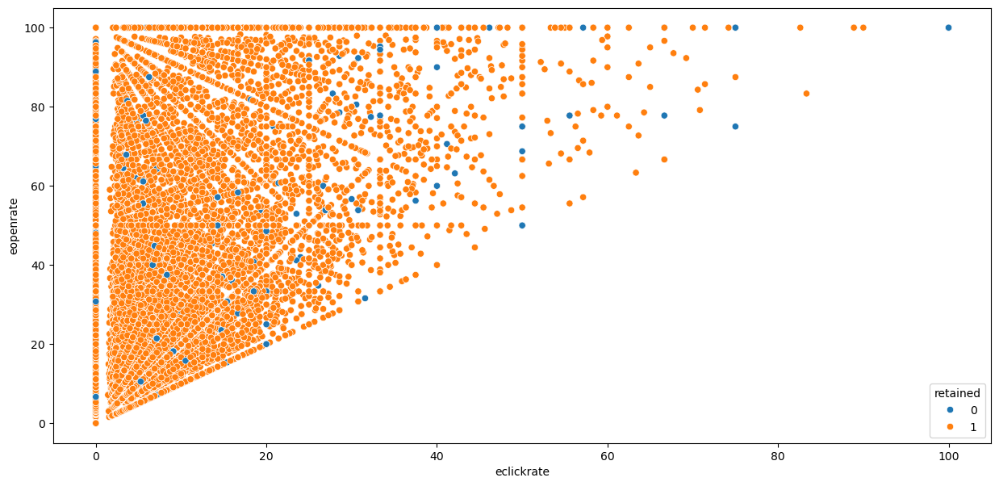

In [44]:
plt.figure(figsize=(15,7))
sns.scatterplot(x= data.eclickrate, y = data.eopenrate, hue= data.retained)
plt.show()

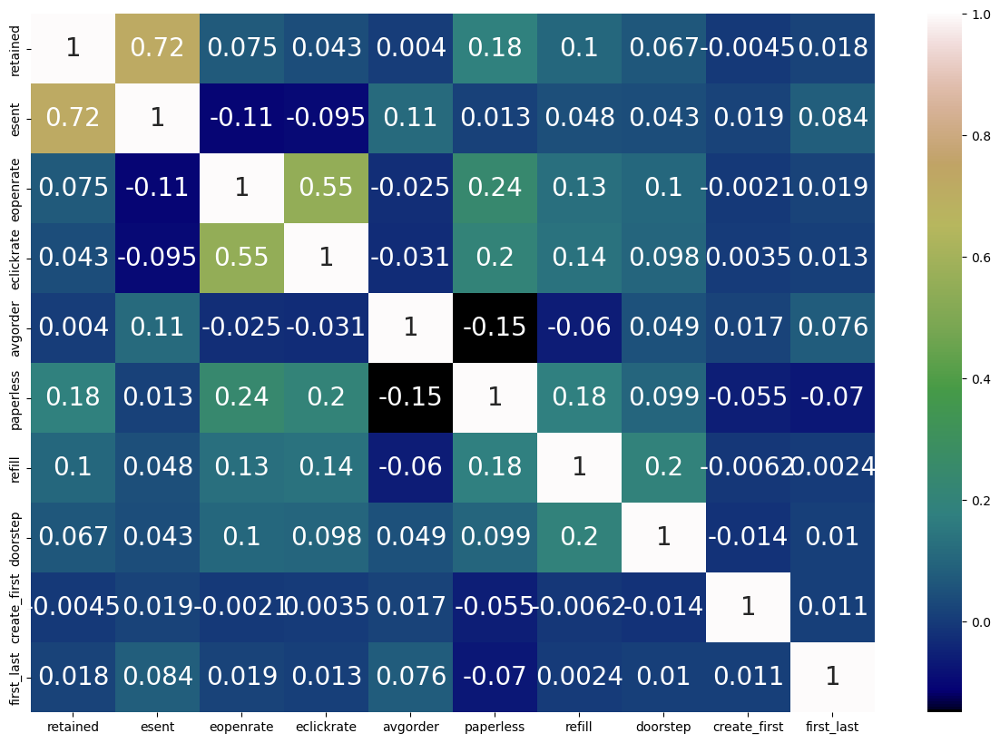

In [46]:
plt.figure(figsize=(15,10))
corr = data[['retained','esent','eopenrate','eclickrate','avgorder','paperless','refill','doorstep','create_first','first_last']].corr()
sns.heatmap(corr,annot=True,annot_kws={'size':20}, cmap = 'gist_earth');

In [47]:
#The Box-Cox transformation is a family of power transformations that can be useful when dealing with non-constant variance or skewed data. 
#It is often applied to make the data more closely approximate a normal distribution.
xtrain['avgorder'] = s.boxcox(xtrain.avgorder+1)[0]
xtrain['esent'] = s.boxcox(xtrain.esent+1)[0]
xtrain['eopenrate'] = s.boxcox(xtrain.eopenrate+1)[0]
xtrain['eclickrate'] = s.boxcox(xtrain.eclickrate+1)[0]
xtrain['create_first'] = s.boxcox(abs(xtrain.create_first)+1)[0]
xtrain['first_last'] = s.boxcox(abs(xtrain.first_last)+5)[0]

Transformation

In [49]:
xtest['avgorder'] = s.boxcox(xtest.avgorder+1)[0]
xtest['esent'] = s.boxcox(xtest.esent+1)[0]
xtest['eopenrate'] = s.boxcox(xtest.eopenrate+1)[0]
xtest['eclickrate'] = s.boxcox(xtest.eclickrate+1)[0]
xtest['create_first'] = s.boxcox(abs(xtest.create_first)+1)[0]
xtest['first_last'] = s.boxcox(abs(xtest.first_last)+5)[0]

In [50]:
xtest.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,favday,city,create_first,first_last
28560,21.743259,3.529514,0.000000,9.413377,1,0,0,Friday,DEL,0.000000,1.007105
24420,4.839962,3.717061,0.000000,9.413377,1,1,0,Thursday,MAA,0.000000,1.007105
4877,24.960109,2.245688,0.401215,12.563467,0,0,0,Thursday,MAA,1.138536,1.007105
26361,28.613335,1.083367,0.000000,14.630119,0,0,0,Wednesday,DEL,0.974302,1.546708
26882,28.097327,3.098832,0.000000,8.962359,0,1,0,Friday,BOM,1.161843,1.448632


In [51]:
xtest.describe()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last
count,9241.000000,9241.000000,9241.000000,9241.000000,9241.000000,9241.000000,9241.000000,9241.000000,9241.000000
mean,17.782127,2.185053,0.156313,10.785576,0.649497,0.097608,0.038416,0.489979,1.172948
std,9.887039,1.526592,0.191107,2.309080,0.477153,0.296801,0.192208,0.470272,0.223411
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.007105
25%,10.788229,0.000000,0.000000,9.413377,0.000000,0.000000,0.000000,0.000000,1.007105
50%,20.650628,2.437285,0.000000,10.658952,1.000000,0.000000,0.000000,0.459167,1.007105
75%,26.014038,3.501732,0.385810,12.095721,1.000000,0.000000,0.000000,0.978437,1.429918
max,44.811682,4.407239,0.415009,16.731190,1.000000,1.000000,1.000000,1.208851,1.569467


In [52]:
xtrain.describe()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last
count,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000,21560.000000
mean,18.973933,2.975014,0.579727,10.395828,0.648840,0.094017,0.039100,1.046145,1.249443
std,10.559853,2.129650,0.606762,2.200029,0.477344,0.291859,0.193838,1.054457,0.265104
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.046266
25%,11.934921,1.243442,0.000000,9.019938,0.000000,0.000000,0.000000,0.000000,1.046266
50%,21.886736,3.271676,0.813487,10.234642,1.000000,0.000000,0.000000,0.627201,1.046266
75%,27.717083,4.719024,1.169130,11.694110,1.000000,0.000000,0.000000,2.097854,1.553711
max,47.844703,6.611139,1.593362,16.039565,1.000000,1.000000,1.000000,3.257473,1.720662


Scaling

In [53]:
#SS.fit_transform(...): This part fits a Standard Scaler (SS) to the selected subset of columns and simultaneously transforms the data. The 
#fit_transform method is used to both compute the mean and standard deviation necessary for scaling and apply the transformation in a single step.

SS = StandardScaler()

a = SS.fit_transform(xtrain[['eclickrate','eopenrate','eclickrate','avgorder','esent','create_first','first_last']])

In [54]:
xtrain['eclickrate'] = a[:,0]
xtrain['eopenrate'] = a[:,1]
xtrain['eclickrate'] = a[:,2]
xtrain['avgorder'] = a[:,3]
xtrain['esent'] = a[:,4]
xtrain['create_first'] = a[:,5]
xtrain['first_last'] = a[:,6]

In [55]:
b = SS.transform(xtest[['eclickrate','eopenrate','eclickrate','avgorder','esent','create_first','first_last']])

In [56]:
xtest['eclickrate'] = b[:,0]
xtest['eopenrate'] = b[:,1]
xtest['eclickrate'] = b[:,2]
xtest['avgorder'] = b[:,3]
xtest['esent'] = b[:,4]
xtest['create_first'] = b[:,5]
xtest['first_last'] = b[:,6]

In [57]:
xtest.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,favday,city,create_first,first_last
28560,0.262257,0.260377,-0.955465,-0.446573,1,0,0,Friday,DEL,-0.992140,-0.914144
24420,-1.338494,0.348444,-0.955465,-0.446573,1,1,0,Thursday,MAA,-0.992140,-0.914144
4877,0.566894,-0.342471,-0.294211,0.985300,0,0,0,Thursday,MAA,0.087622,-0.914144
26361,0.912856,-0.888264,-0.955465,1.924697,0,0,0,Wednesday,DEL,-0.068134,1.121338
26882,0.863990,0.058141,-0.955465,-0.651584,0,1,0,Friday,BOM,0.109726,0.751377


One Hot Encoding

In [58]:
#The provided code involves manipulating a DataFrame xtrain by dropping specified columns ('city' and 'favday') and 
#adding new columns with one-hot encoded values for the categorical variables 'favday' and 'city'. Let's break down the code:

xtrain = pd.concat((xtrain.drop(columns=['city','favday'],axis=1),pd.get_dummies(xtrain[['favday','city']],drop_first=True, dtype=float)),
                   axis=1)

In [60]:
xtrain.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last,favday_Monday,favday_Saturday,favday_Sunday,favday_Thursday,favday_Tuesday,favday_Wednesday,city_BOM,city_DEL,city_MAA
11817,0.989709,-0.491157,0.528700,1.074438,1,0,0,0.951908,-0.76642,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
30419,-0.666598,0.742573,1.170934,-0.625411,1,0,0,-0.992140,-0.76642,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
19590,0.162616,-1.396982,-0.955465,-0.076524,1,0,0,-0.992140,-0.76642,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
27767,-1.254667,0.184532,-0.955465,-0.625411,1,0,0,-0.992140,-0.76642,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
632,0.719234,0.414319,1.270701,-0.033913,0,0,0,0.779801,-0.76642,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0


In [61]:
xtest = pd.concat((xtest.drop(columns=['city','favday'],axis=1),pd.get_dummies(xtest[['favday','city']],drop_first=True))
                  ,axis=1)

In [62]:
xtest.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last,favday_Monday,favday_Saturday,favday_Sunday,favday_Thursday,favday_Tuesday,favday_Wednesday,city_BOM,city_DEL,city_MAA
28560,0.262257,0.260377,-0.955465,-0.446573,1,0,0,-0.992140,-0.914144,False,False,False,False,False,False,False,True,False
24420,-1.338494,0.348444,-0.955465,-0.446573,1,1,0,-0.992140,-0.914144,False,False,False,True,False,False,False,False,True
4877,0.566894,-0.342471,-0.294211,0.985300,0,0,0,0.087622,-0.914144,False,False,False,True,False,False,False,False,True
26361,0.912856,-0.888264,-0.955465,1.924697,0,0,0,-0.068134,1.121338,False,False,False,False,False,True,False,True,False
26882,0.863990,0.058141,-0.955465,-0.651584,0,1,0,0.109726,0.751377,False,False,False,False,False,False,True,False,False


In [66]:
#Converting float type columns columns to integer
xtrain.update(xtrain.filter(regex='^favday_').astype(int))

In [67]:
xtrain.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last,favday_Monday,favday_Saturday,favday_Sunday,favday_Thursday,favday_Tuesday,favday_Wednesday,city_BOM,city_DEL,city_MAA
11817,0.989709,-0.491157,0.528700,1.074438,1,0,0,0.951908,-0.76642,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
30419,-0.666598,0.742573,1.170934,-0.625411,1,0,0,-0.992140,-0.76642,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
19590,0.162616,-1.396982,-0.955465,-0.076524,1,0,0,-0.992140,-0.76642,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
27767,-1.254667,0.184532,-0.955465,-0.625411,1,0,0,-0.992140,-0.76642,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
632,0.719234,0.414319,1.270701,-0.033913,0,0,0,0.779801,-0.76642,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0


In [68]:
xtest.update(xtest.filter(regex='^favday').astype(int))

In [69]:
xtest.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last,favday_Monday,favday_Saturday,favday_Sunday,favday_Thursday,favday_Tuesday,favday_Wednesday,city_BOM,city_DEL,city_MAA
28560,0.262257,0.260377,-0.955465,-0.446573,1,0,0,-0.992140,-0.914144,0,0,0,0,0,0,False,True,False
24420,-1.338494,0.348444,-0.955465,-0.446573,1,1,0,-0.992140,-0.914144,0,0,0,1,0,0,False,False,True
4877,0.566894,-0.342471,-0.294211,0.985300,0,0,0,0.087622,-0.914144,0,0,0,1,0,0,False,False,True
26361,0.912856,-0.888264,-0.955465,1.924697,0,0,0,-0.068134,1.121338,0,0,0,0,0,1,False,True,False
26882,0.863990,0.058141,-0.955465,-0.651584,0,1,0,0.109726,0.751377,0,0,0,0,0,0,True,False,False


In [70]:
xtrain.to_csv('train.csv')

In [71]:
xtest.to_csv('test.csv')

Balancing the Data

In [72]:
xtrain.shape

(21560, 18)

In [73]:
ytrain.shape

(21560,)

In [76]:
from imblearn.combine import SMOTEENN

In [75]:
!pip install imblearn

   ---------------------------------------- 0.0/235.6 kB ? eta -:--:--
   ------------------- -------------------- 112.6/235.6 kB 2.2 MB/s eta 0:00:01
   ---------------------------------------- 235.6/235.6 kB 3.6 MB/s eta 0:00:00


In [77]:
#the code is addressing the issue of class imbalance in the training dataset (xtrain and ytrain). It oversamples the minority class 
#using SMOTE and then applies the Edited Nearest Neighbors algorithm to clean the dataset. The resulting balanced dataset is 
#stored in xtrain_bal (features) and ytrain_bal (labels)
xtrain_bal,ytrain_bal = SMOTEENN().fit_resample(xtrain,ytrain)


<Axes: xlabel='retained'>

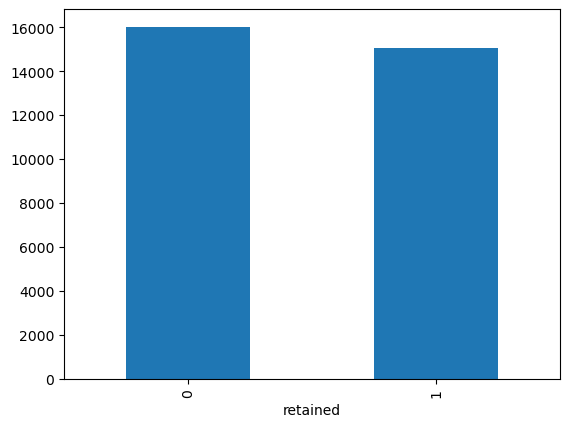

In [78]:
ytrain_bal.value_counts().plot(kind='bar')

Machine Learning Modelling

1. LOGISTIC REGRESSION

In [79]:
print(xtrain_bal.shape)
print(ytrain_bal.shape)

(31099, 18)
(31099,)


In [81]:
# Full Model
# Logit stands for logistic regression, which is commonly used for binary classification problems.
# In logistic regression, the dependent variable is binary (0 or 1), representing the classes to be predicted.
# This model can be used to predict the probability of belonging to a particular class and analyze the relationship between the independent variables and the log-odds of the dependent variable.
log_reg = sm.Logit(ytrain_bal,xtrain_bal).fit()
print(log_reg.summary())

Optimization terminated successfully.
         Current function value: 0.141185
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:               retained   No. Observations:                31099
Model:                          Logit   Df Residuals:                    31081
Method:                           MLE   Df Model:                           17
Date:                Wed, 22 Nov 2023   Pseudo R-squ.:                  0.7962
Time:                        14:47:31   Log-Likelihood:                -4390.7
converged:                       True   LL-Null:                       -21542.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
esent                3.8909      0.051     75.951      0.000       3.791       3.991
eopenrate  

In logistic regression, the odds ratio represents the ratio of the odds of an event occurring in one group to the odds of it occurring in another group. In this context, the odds ratios are associated with the independent variables in the logistic regression model, and they indicate how the odds of the event (in this case, the target variable being 1) change with a one-unit increase in the corresponding independent variable.

In [82]:
odds = pd.DataFrame((np.exp(log_reg.params)),index = xtrain.columns,columns=['ODDS'])
odds

,ODDS
esent,48.956123
eopenrate,0.698909
eclickrate,1.527697
avgorder,0.930917
paperless,1.656837
refill,4.436442
doorstep,10.566684
create_first,0.593070
first_last,0.631756
favday_Monday,1.164255


In [91]:
ypred = log_reg.predict(xtest)
ypred = [1 if i > 0.5 else 0 for i in ypred]

In [84]:
xtest.head

<bound method NDFrame.head of           esent  eopenrate  eclickrate  avgorder  paperless  refill  doorstep  \
28560  0.262257   0.260377   -0.955465 -0.446573          1       0         0   
24420 -1.338494   0.348444   -0.955465 -0.446573          1       1         0   
4877   0.566894  -0.342471   -0.294211  0.985300          0       0         0   
26361  0.912856  -0.888264   -0.955465  1.924697          0       0         0   
26882  0.863990   0.058141   -0.955465 -0.651584          0       1         0   
...         ...        ...         ...       ...        ...     ...       ...   
12985  0.466252   0.605344   -0.283112  1.300145          1       0         0   
14257  0.765720  -0.868597   -0.955465 -0.577974          1       0         0   
20150 -0.104790  -1.396982   -0.955465  0.190152          1       0         0   
1802   1.106628   0.048072   -0.292570  0.431400          0       0         0   
27313  0.765720  -0.868597   -0.955465  1.825751          0       0         0  

In [85]:
xtest.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last,favday_Monday,favday_Saturday,favday_Sunday,favday_Thursday,favday_Tuesday,favday_Wednesday,city_BOM,city_DEL,city_MAA
28560,0.262257,0.260377,-0.955465,-0.446573,1,0,0,-0.992140,-0.914144,0,0,0,0,0,0,False,True,False
24420,-1.338494,0.348444,-0.955465,-0.446573,1,1,0,-0.992140,-0.914144,0,0,0,1,0,0,False,False,True
4877,0.566894,-0.342471,-0.294211,0.985300,0,0,0,0.087622,-0.914144,0,0,0,1,0,0,False,False,True
26361,0.912856,-0.888264,-0.955465,1.924697,0,0,0,-0.068134,1.121338,0,0,0,0,0,1,False,True,False
26882,0.863990,0.058141,-0.955465,-0.651584,0,1,0,0.109726,0.751377,0,0,0,0,0,0,True,False,False


In [86]:
xtrain.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last,favday_Monday,favday_Saturday,favday_Sunday,favday_Thursday,favday_Tuesday,favday_Wednesday,city_BOM,city_DEL,city_MAA
11817,0.989709,-0.491157,0.528700,1.074438,1,0,0,0.951908,-0.76642,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
30419,-0.666598,0.742573,1.170934,-0.625411,1,0,0,-0.992140,-0.76642,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
19590,0.162616,-1.396982,-0.955465,-0.076524,1,0,0,-0.992140,-0.76642,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
27767,-1.254667,0.184532,-0.955465,-0.625411,1,0,0,-0.992140,-0.76642,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
632,0.719234,0.414319,1.270701,-0.033913,0,0,0,0.779801,-0.76642,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0


In [87]:
#Converting float type columns columns to integer
xtrain.update(xtrain.filter(regex='^favday_').astype(int))
xtrain.update(xtrain.filter(regex='^city_').astype(int))


In [88]:
xtrain.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last,favday_Monday,favday_Saturday,favday_Sunday,favday_Thursday,favday_Tuesday,favday_Wednesday,city_BOM,city_DEL,city_MAA
11817,0.989709,-0.491157,0.528700,1.074438,1,0,0,0.951908,-0.76642,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
30419,-0.666598,0.742573,1.170934,-0.625411,1,0,0,-0.992140,-0.76642,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
19590,0.162616,-1.396982,-0.955465,-0.076524,1,0,0,-0.992140,-0.76642,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
27767,-1.254667,0.184532,-0.955465,-0.625411,1,0,0,-0.992140,-0.76642,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
632,0.719234,0.414319,1.270701,-0.033913,0,0,0,0.779801,-0.76642,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0


In [89]:
#Converting float type columns columns to integer
xtest.update(xtest.filter(regex='^favday_').astype(int))
xtest.update(xtest.filter(regex='^city_').astype(int))

In [90]:
xtest.head()

,esent,eopenrate,eclickrate,avgorder,paperless,refill,doorstep,create_first,first_last,favday_Monday,favday_Saturday,favday_Sunday,favday_Thursday,favday_Tuesday,favday_Wednesday,city_BOM,city_DEL,city_MAA
28560,0.262257,0.260377,-0.955465,-0.446573,1,0,0,-0.992140,-0.914144,0,0,0,0,0,0,0,1,0
24420,-1.338494,0.348444,-0.955465,-0.446573,1,1,0,-0.992140,-0.914144,0,0,0,1,0,0,0,0,1
4877,0.566894,-0.342471,-0.294211,0.985300,0,0,0,0.087622,-0.914144,0,0,0,1,0,0,0,0,1
26361,0.912856,-0.888264,-0.955465,1.924697,0,0,0,-0.068134,1.121338,0,0,0,0,0,1,0,1,0
26882,0.863990,0.058141,-0.955465,-0.651584,0,1,0,0.109726,0.751377,0,0,0,0,0,0,1,0,0


In [92]:
#The provided code involves making predictions using a logistic regression model and then 
#thresholding the predicted probabilities to obtain binary predictions.
ypred = log_reg.predict(xtest)
ypred = [1 if i > 0.5 else 0 for i in ypred]

In [93]:
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           0       0.68      0.91      0.78      1906
           1       0.97      0.89      0.93      7335

    accuracy                           0.89      9241
   macro avg       0.83      0.90      0.85      9241
weighted avg       0.91      0.89      0.90      9241



In [94]:
cp =classification_report(ytest,ypred).split()
cp[5],cp[6],cp[7]

('0.68', '0.91', '0.78')

In [98]:
# summarizes various classification metrics for a model (referred to as the 'Base_model') and 
#organizes them in a structured way for easier analysis and comparison. The metrics include 
#precision, recall, F1 score, accuracy, and ROC AUC score. 
metrics_df = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,ypred),3),round(roc_auc_score(ytest,ypred),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Base_model']).T
metrics_df

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.68,0.91,0.78,0.894,0.899


In [97]:
from sklearn.metrics import roc_curve, auc, roc_auc_score

In [99]:
# summarizes various classification metrics for a model (referred to as the 'Base_model') and 
#organizes them in a structured way for easier analysis and comparison. The metrics include 
#precision, recall, F1 score, accuracy, and ROC AUC score. 
metrics_df = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,ypred),3),round(roc_auc_score(ytest,ypred),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Base_model']).T
metrics_df

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.68,0.91,0.78,0.894,0.899


VIF

In [100]:
vif = [variance_inflation_factor(xtrain_bal.values,i) for i in range(xtrain_bal.shape[1])]

NameError: name 'variance_inflation_factor' is not defined

In [101]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [102]:
vif = [variance_inflation_factor(xtrain_bal.values,i) for i in range(xtrain_bal.shape[1])]

In [103]:
vif_df = pd.DataFrame({'Features':xtrain_bal.columns,'VIF':vif})
vif_df.sort_values('VIF',ascending=False)

,Features,VIF
15,city_BOM,2.950786
16,city_DEL,2.830498
17,city_MAA,2.814804
4,paperless,2.812554
9,favday_Monday,2.105813
13,favday_Tuesday,2.049690
2,eclickrate,2.008760
1,eopenrate,1.980652
14,favday_Wednesday,1.794064
12,favday_Thursday,1.780288


Feature Selection

In [104]:
LR = LogisticRegression()

In [105]:
## RFE SElection
rfe = RFE(estimator=LR).fit(xtrain_bal,ytrain_bal)

feature_ranking = pd.DataFrame([xtrain_bal.columns,rfe.ranking_],index=['Feature','Ranking']).T
rfe_feat=feature_ranking[feature_ranking.Ranking==1]
rfe_feat.Feature

0               esent
5              refill
6            doorstep
7        create_first
8          first_last
10    favday_Saturday
11      favday_Sunday
15           city_BOM
17           city_MAA
Name: Feature, dtype: object

In [106]:
feature_ranking.sort_values('Ranking').reset_index()

,index,Feature,Ranking
0,0,esent,1
1,15,city_BOM,1
2,11,favday_Sunday,1
3,10,favday_Saturday,1
4,7,create_first,1
5,6,doorstep,1
6,8,first_last,1
7,5,refill,1
8,17,city_MAA,1
9,2,eclickrate,2


In [107]:
x = xtrain_bal[rfe_feat.Feature]
y= ytrain_bal

rfe_reg = sm.Logit(y,x).fit()
print(rfe_reg.summary())

Optimization terminated successfully.
         Current function value: 0.173473
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:               retained   No. Observations:                31099
Model:                          Logit   Df Residuals:                    31090
Method:                           MLE   Df Model:                            8
Date:                Wed, 22 Nov 2023   Pseudo R-squ.:                  0.7496
Time:                        20:42:16   Log-Likelihood:                -5394.8
converged:                       True   LL-Null:                       -21542.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
esent               3.4835      0.042     83.480      0.000       3.402       3.565
refill        

Confusion Matrix: [[1749  157]
 [1007 6328]]


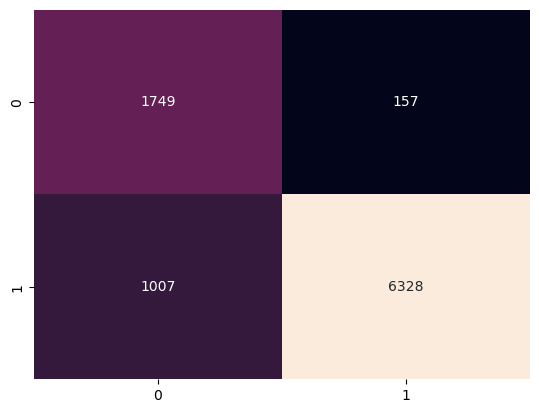

In [108]:
rfe_ypred_test = rfe_reg.predict(xtest[rfe_feat.Feature])
rfe_ypred_test = [1 if i > 0.5 else 0 for i in rfe_ypred_test]
cm_1 = confusion_matrix(ytest,rfe_ypred_test)
print('Confusion Matrix:',cm_1)
sns.heatmap(cm_1,annot=True,cbar=False,fmt='d');

In [109]:
print('RFE Feature selected Logistic Regression:')
print(classification_report(ytest,rfe_ypred_test))
print('Cohen Kappa Score:',round(cohen_kappa_score(ytest,rfe_ypred_test),2))
print('ROC AUC Score:',round(roc_auc_score(ytest,rfe_ypred_test),3))

RFE Feature selected Logistic Regression:
              precision    recall  f1-score   support

           0       0.63      0.92      0.75      1906
           1       0.98      0.86      0.92      7335

    accuracy                           0.87      9241
   macro avg       0.81      0.89      0.83      9241
weighted avg       0.91      0.87      0.88      9241

Cohen Kappa Score: 0.67
ROC AUC Score: 0.89


ROC AUC Score: 0.89


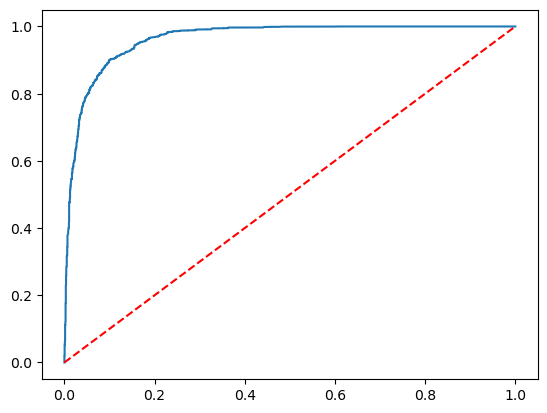

In [110]:
# The model using rfe features selection gave best result than forward and backward selection techniques
fpr,tpr,th = roc_curve(ytest,rfe_reg.predict(xtest[rfe_feat.Feature]))
print('ROC AUC Score:',round(roc_auc_score(ytest,rfe_ypred_test),3))
plt.plot(fpr,tpr)
plt.plot([0,1],[0,1],'r--')
plt.show()

In [111]:
log_rfe = LogisticRegression().fit(xtrain_bal[rfe_feat.Feature],ytrain_bal)

In [122]:
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain[rfe_feat.Feature]),
    feature_names=rfe_feat.Feature,
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=xtest[rfe_feat.Feature].iloc[1],
    predict_fn=log_rfe.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [123]:
cp = classification_report(ytest,rfe_ypred_test).split()
metrics_df1 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,rfe_ypred_test),3),round(roc_auc_score(ytest,rfe_ypred_test),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Rfe_Features_model']).T

metrics_df2 = pd.concat([metrics_df,metrics_df1],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.68,0.91,0.78,0.894,0.899
Rfe_Features_model,0.63,0.92,0.75,0.874,0.89


Decision Tree

In [125]:
dt = DecisionTreeClassifier()

Hyperparameter Tuning

In [127]:
from sklearn.model_selection import GridSearchCV


GridSearchCV(estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'max_depth': [3, 4, 5], 'max_leaf_nodes': [13, 14, 15],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 3, 4]},
             scoring='accuracy')

In [128]:
params = {'max_depth':[3,4,5],
    'min_samples_split':[2,3,4],
    'min_samples_leaf':[1,2,3],
    'max_leaf_nodes':[13,14,15]}

dt_grid = GridSearchCV(dt,param_grid=params,scoring='accuracy',n_jobs=-1)
dt_grid.fit(xtrain_bal,ytrain_bal)

GridSearchCV(estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'max_depth': [3, 4, 5], 'max_leaf_nodes': [13, 14, 15],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 3, 4]},
             scoring='accuracy')

In [129]:
dt_grid.best_params_

{'max_depth': 5,
 'max_leaf_nodes': 14,
 'min_samples_leaf': 1,
 'min_samples_split': 2}

In [130]:
tuned_mod = DecisionTreeClassifier(criterion= 'gini', max_depth =  4, max_leaf_nodes =  14, 
                                   min_samples_leaf =  1, min_samples_split =  2)

In [131]:
tuned_mod.fit(xtrain_bal,ytrain_bal)

DecisionTreeClassifier(max_depth=4, max_leaf_nodes=14)

In [132]:
ypred_tuned = tuned_mod.predict(xtest)

In [133]:
feat_imp = pd.DataFrame({'Features':xtest.columns,'Importance':tuned_mod.feature_importances_}).sort_values('Importance',ascending=False)
feat_imp[feat_imp.Importance!=0]

,Features,Importance
0,esent,0.958415
4,paperless,0.014144
7,create_first,0.010590
2,eclickrate,0.009036
1,eopenrate,0.006542
5,refill,0.001273


In [134]:
print('Decision Tree:')
print(classification_report(ytest,ypred_tuned))
print('Cohen Kappa Score:',round(cohen_kappa_score(ytest,ypred_tuned),3))
print('ROC AUC Score:',round(roc_auc_score(ytest,tuned_mod.predict_proba(xtest)[:,1]),2))

Decision Tree:
              precision    recall  f1-score   support

           0       0.59      0.93      0.72      1906
           1       0.98      0.83      0.90      7335

    accuracy                           0.85      9241
   macro avg       0.78      0.88      0.81      9241
weighted avg       0.90      0.85      0.86      9241

Cohen Kappa Score: 0.625
ROC AUC Score: 0.92


In [135]:
dot = export_graphviz(tuned_mod,feature_names=xtrain_bal.columns,class_names=['No','Yes'])
graph = pydotplus.graph_from_dot_data(dot)
Image(graph.create_png())

NameError: name 'pydotplus' is not defined

In [136]:
import pydotplus

ModuleNotFoundError: No module named 'pydotplus'

In [137]:
import pydot

ModuleNotFoundError: No module named 'pydot'

In [138]:
!pip install pydotplus

     ---------------------------------------- 0.0/278.7 kB ? eta -:--:--
     ---- -------------------------------- 30.7/278.7 kB 435.7 kB/s eta 0:00:01
     -------------------------------------- 278.7/278.7 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for pydotplus: filename=pydotplus-2.0.2-py3-none-any.whl size=24574 sha256=4b1e491d07491c99f472f125ba45241a1a4020593c61b2a2ced9c74eca1a848a
  Stored in directory: c:\users\deeps\appdata\local\pip\cache\wheels\bd\ce\e8\ff9d9c699514922f57caa22fbd55b0a32761114b4c4acc9e03
Successfully built pydotplus


In [139]:
import pydotplus

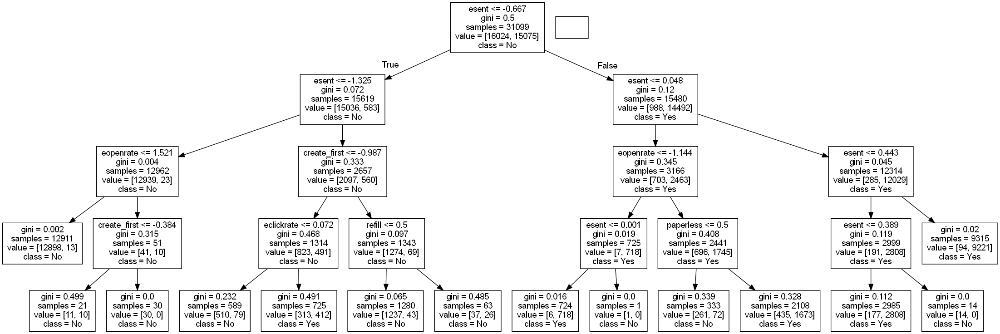

In [147]:
dot = export_graphviz(tuned_mod,feature_names=xtrain_bal.columns,class_names=['No','Yes'])
graph = pydotplus.graph_from_dot_data(dot)
Image(graph.create_png())

In [141]:
from IPython.display import Image

In [143]:
!pip install graphviz

     ---------------------------------------- 0.0/47.0 kB ? eta -:--:--
     ------------------------ ------------- 30.7/47.0 kB 640.0 kB/s eta 0:00:01
     -------------------------------------- 47.0/47.0 kB 584.1 kB/s eta 0:00:00


In [145]:
from graphviz import Digraph

In [148]:
print('Cohen Kappa Score:',round(cohen_kappa_score(ytest,ypred_tuned),2))

Cohen Kappa Score: 0.63


In [149]:
plot_roc_curve(estimator=tuned_mod,X= xtest,y= ytest)
plt.plot([0,1],[0,1],'r--')
plt.show()

NameError: name 'plot_roc_curve' is not defined

In [150]:
from sklearn.metrics import plot_confusion_matrix,plot_roc_curve,roc_auc_score,roc_curve

ImportError: cannot import name 'plot_confusion_matrix' from 'sklearn.metrics' (C:\Users\deeps\.conda\envs\example\Lib\site-packages\sklearn\metrics\__init__.py)

In [159]:
from sklearn.metrics import plot_roc_curve,roc_auc_score,roc_curve

ImportError: cannot import name 'plot_roc_curve' from 'sklearn.metrics' (C:\Users\deeps\.conda\envs\example\Lib\site-packages\sklearn\metrics\__init__.py)

In [152]:
from sklearn.metrics import plot_roc_curve

ImportError: cannot import name 'plot_roc_curve' from 'sklearn.metrics' (C:\Users\deeps\.conda\envs\example\Lib\site-packages\sklearn\metrics\__init__.py)

In [157]:
from scikitplot.metrics import plot_roc_curve

In [154]:
!pip install scikit-plot

In [164]:
roc_curve(estimator=tuned_mod,X= xtest,y= ytest)
plt.plot([0,1],[0,1],'r--')
plt.show()

TypeError: missing a required argument: 'y_true'

In [165]:
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain_bal),
    feature_names=xtrain.columns,
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=xtest.iloc[1],
    predict_fn=tuned_mod.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [166]:
cp = classification_report(ytest,ypred_tuned).split()
metrics_df3 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,ypred_tuned),3),round(roc_auc_score(ytest,ypred_tuned),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Decision_Tree']).T

metrics_df2 = pd.concat([metrics_df2,metrics_df3],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.68,0.91,0.78,0.894,0.899
Rfe_Features_model,0.63,0.92,0.75,0.874,0.89
Decision_Tree,0.59,0.93,0.72,0.851,0.88


Random Forest (Bagging)

In [169]:
rf = RandomForestClassifier(n_estimators=250)

In [168]:
from sklearn.ensemble import RandomForestClassifier

In [170]:
params = {'max_depth':np.arange(30,50,5)}

In [171]:
rf_grid = GridSearchCV(estimator=rf,param_grid=params,cv=5,n_jobs=-1)
rf_grid.fit(xtrain_bal,ytrain_bal)

GridSearchCV(cv=5, estimator=RandomForestClassifier(n_estimators=250),
             n_jobs=-1, param_grid={'max_depth': array([30, 35, 40, 45])})

In [172]:
rf_grid.best_params_

{'max_depth': 45}

In [173]:
rf_tuned = RandomForestClassifier(n_estimators=250,max_depth=30).fit(xtrain_bal,ytrain_bal)

In [174]:
print('Random Forest:')
rf_ypred = rf_tuned.predict(xtest)
print(classification_report(ytest,rf_ypred))
print("Cohen Kappa Score:",round(cohen_kappa_score(rf_ypred,ytest),3))

Random Forest:
              precision    recall  f1-score   support

           0       0.64      0.93      0.76      1906
           1       0.98      0.86      0.92      7335

    accuracy                           0.88      9241
   macro avg       0.81      0.90      0.84      9241
weighted avg       0.91      0.88      0.88      9241

Cohen Kappa Score: 0.677


In [175]:
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain_bal),
    feature_names=xtrain.columns,
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=xtest.iloc[1],
    predict_fn=rf_tuned.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [176]:
cp = classification_report(ytest,rf_ypred).split()
metrics_df4 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,rf_ypred),3),round(roc_auc_score(ytest,rf_ypred),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Random_Forest']).T

metrics_df2 = pd.concat([metrics_df2,metrics_df4],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.68,0.91,0.78,0.894,0.899
Rfe_Features_model,0.63,0.92,0.75,0.874,0.89
Decision_Tree,0.59,0.93,0.72,0.851,0.88
Random_Forest,0.64,0.93,0.76,0.876,0.898


Boosting

1.Adaboost

In [177]:
from sklearn.ensemble import AdaBoostClassifier

In [178]:
adaboost = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(),n_estimators=50)

In [179]:
adaboost.fit(xtrain_bal,ytrain_bal)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier())

In [180]:
ypred_prob = adaboost.predict_proba(xtest)[:,1]

In [181]:
ypred = adaboost.predict(xtest)

In [182]:
print('Adaboost:')
print(classification_report(ytest,ypred))
print('Cohen Kappa Score:',round(cohen_kappa_score(ytest,ypred),2))

Adaboost:
              precision    recall  f1-score   support

           0       0.42      0.93      0.58      1906
           1       0.97      0.66      0.79      7335

    accuracy                           0.72      9241
   macro avg       0.70      0.80      0.68      9241
weighted avg       0.86      0.72      0.74      9241

Cohen Kappa Score: 0.41


In [183]:
fpr,tpr,th = roc_curve(ytest,ypred_prob)

In [184]:
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain_bal),
    feature_names=xtrain.columns,
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=xtest.iloc[1],
    predict_fn=adaboost.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [185]:
cp = classification_report(ytest,ypred).split()
metrics_df5 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,ypred),3),round(roc_auc_score(ytest,ypred),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['AdaBoost']).T

metrics_df2 = pd.concat([metrics_df2,metrics_df5],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.68,0.91,0.78,0.894,0.899
Rfe_Features_model,0.63,0.92,0.75,0.874,0.89
Decision_Tree,0.59,0.93,0.72,0.851,0.88
Random_Forest,0.64,0.93,0.76,0.876,0.898
AdaBoost,0.42,0.93,0.58,0.717,0.796


XG Boost

In [188]:
!pip install xgboost

   ---------------------------------------- 0.0/99.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/99.8 MB ? eta -:--:--
   ---------------------------------------- 0.2/99.8 MB 4.6 MB/s eta 0:00:22
   ---------------------------------------- 0.9/99.8 MB 9.5 MB/s eta 0:00:11
    --------------------------------------- 1.5/99.8 MB 10.6 MB/s eta 0:00:10
    --------------------------------------- 2.5/99.8 MB 13.1 MB/s eta 0:00:08
   - -------------------------------------- 3.5/99.8 MB 14.7 MB/s eta 0:00:07
   - -------------------------------------- 4.7/99.8 MB 16.6 MB/s eta 0:00:06
   -- ------------------------------------- 6.2/99.8 MB 19.0 MB/s eta 0:00:05
   --- ------------------------------------ 7.8/99.8 MB 20.7 MB/s eta 0:00:05
   --- ------------------------------------ 9.4/99.8 MB 22.3 MB/s eta 0:00:05
   ---- ----------------------------------- 11.3/99.8 MB 28.4 MB/s eta 0:00:04
   ----- ---------------------------------- 12.9/99.8 MB 32.7 MB/s eta 0:00:03
  

In [189]:
from xgboost import XGBClassifier

In [190]:
xgb = XGBClassifier(gamma=1)

In [191]:
xgb.fit(xtrain_bal,ytrain_bal)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [192]:
ypred =xgb.predict(xtest)
ypred_prob = xgb.predict_proba(xtest)[:,1]

In [193]:
print('XG Boost')
print(classification_report(ytest,ypred))
print('COhen Kappa Score:',round(cohen_kappa_score(ytest,ypred),2))

XG Boost
              precision    recall  f1-score   support

           0       0.62      0.94      0.75      1906
           1       0.98      0.85      0.91      7335

    accuracy                           0.87      9241
   macro avg       0.80      0.90      0.83      9241
weighted avg       0.91      0.87      0.88      9241

COhen Kappa Score: 0.67


In [194]:
fpr,tpr,th = roc_curve(ytest,ypred_prob)

In [197]:
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain_bal),
    feature_names=xtrain.columns,
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=xtest.iloc[1],
    predict_fn=xgb.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [198]:
cp = classification_report(ytest,ypred).split()
metrics_df6 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,ypred),3),round(roc_auc_score(ytest,ypred),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['XGBoost']).T

metrics_df2 = pd.concat([metrics_df2,metrics_df6],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.68,0.91,0.78,0.894,0.899
Rfe_Features_model,0.63,0.92,0.75,0.874,0.89
Decision_Tree,0.59,0.93,0.72,0.851,0.88
Random_Forest,0.64,0.93,0.76,0.876,0.898
AdaBoost,0.42,0.93,0.58,0.717,0.796
XGBoost,0.62,0.94,0.75,0.87,0.897


Stacking

In [200]:
from sklearn.ensemble import StackingClassifier

In [201]:
base = [('dt',DecisionTreeClassifier()),('rf',RandomForestClassifier())]
stack_mod = StackingClassifier(estimators=base,final_estimator=AdaBoostClassifier())
stack_mod.fit(xtrain_bal,ytrain_bal)

StackingClassifier(estimators=[('dt', DecisionTreeClassifier()),
                               ('rf', RandomForestClassifier())],
                   final_estimator=AdaBoostClassifier())

In [202]:
ypred = stack_mod.predict(xtest)

In [203]:
print('Stacking:')
print(classification_report(ytest,ypred))
print('Cohen Kappa Score',round(cohen_kappa_score(ytest,ypred),2))

Stacking:
              precision    recall  f1-score   support

           0       0.61      0.94      0.74      1906
           1       0.98      0.84      0.91      7335

    accuracy                           0.86      9241
   macro avg       0.80      0.89      0.83      9241
weighted avg       0.91      0.86      0.87      9241

Cohen Kappa Score 0.66


<Axes: >

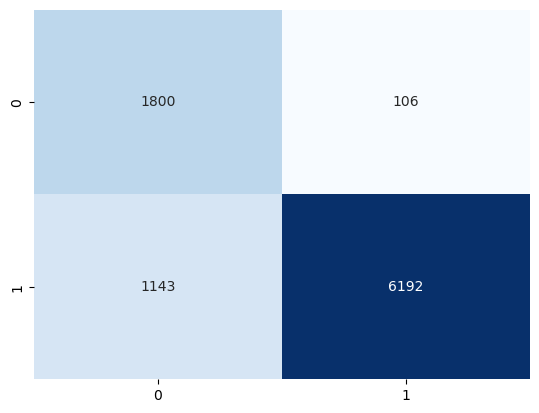

In [204]:
sns.heatmap(confusion_matrix(ytest,ypred),annot=True,fmt='d',cbar=False,cmap='Blues')

In [205]:
lime_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain_bal),
    feature_names=xtrain.columns,
    mode='classification'
)


lime_exp = lime_explainer.explain_instance(
    data_row=xtest.iloc[1],
    predict_fn=stack_mod.predict_proba
)
lime_exp.show_in_notebook(show_table=True)

In [206]:
cp = classification_report(ytest,ypred).split()
metrics_df7 = pd.DataFrame([cp[5],cp[6],cp[7],round(accuracy_score(ytest,ypred),3),round(roc_auc_score(ytest,ypred),3)],
                          index=['Churn_precision','Churn_recall','Churn_f1score','Accuracy','Roc_Auc_Score'],
                         columns=['Stacking_Reg']).T

metrics_df2 = pd.concat([metrics_df2,metrics_df7],axis=0)
metrics_df2

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.68,0.91,0.78,0.894,0.899
Rfe_Features_model,0.63,0.92,0.75,0.874,0.89
Decision_Tree,0.59,0.93,0.72,0.851,0.88
Random_Forest,0.64,0.93,0.76,0.876,0.898
AdaBoost,0.42,0.93,0.58,0.717,0.796
XGBoost,0.62,0.94,0.75,0.87,0.897
Stacking_Reg,0.61,0.94,0.74,0.865,0.894


In [207]:
metrics_df2.style.background_gradient(cmap='Blues')

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.68,0.91,0.78,0.894000,0.899000
Rfe_Features_model,0.63,0.92,0.75,0.874000,0.890000
Decision_Tree,0.59,0.93,0.72,0.851000,0.880000
Random_Forest,0.64,0.93,0.76,0.876000,0.898000
AdaBoost,0.42,0.93,0.58,0.717000,0.796000
XGBoost,0.62,0.94,0.75,0.870000,0.897000
Stacking_Reg,0.61,0.94,0.74,0.865000,0.894000


In [208]:
metrics_df2.style.highlight_max()

,Churn_precision,Churn_recall,Churn_f1score,Accuracy,Roc_Auc_Score
Base_model,0.68,0.91,0.78,0.894000,0.899000
Rfe_Features_model,0.63,0.92,0.75,0.874000,0.890000
Decision_Tree,0.59,0.93,0.72,0.851000,0.880000
Random_Forest,0.64,0.93,0.76,0.876000,0.898000
AdaBoost,0.42,0.93,0.58,0.717000,0.796000
XGBoost,0.62,0.94,0.75,0.870000,0.897000
Stacking_Reg,0.61,0.94,0.74,0.865000,0.894000
